In [ ]:
!pip install -qU transformers ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 904.3/904.3 kB 12.3 MB/s eta 0:00:00


In [ ]:
!unzip yolo_tooth.zip

Archive:  yolo_tooth.zip
   creating: segment_enumerate/
   creating: segment_enumerate/train/
  inflating: segment_enumerate/train/args.yaml  
   creating: segment_enumerate/train/weights/
   creating: segment_enumerate/train2/
  inflating: segment_enumerate/train2/args.yaml  
  inflating: segment_enumerate/train2/BoxF1_curve.png  
  inflating: segment_enumerate/train2/BoxPR_curve.png  
  inflating: segment_enumerate/train2/BoxP_curve.png  
  inflating: segment_enumerate/train2/BoxR_curve.png  
  inflating: segment_enumerate/train2/confusion_matrix.png  
  inflating: segment_enumerate/train2/confusion_matrix_normalized.png  
  inflating: segment_enumerate/train2/events.out.tfevents.1735038428.22fbc4407b8f.522.2  
  inflating: segment_enumerate/train2/labels.jpg  
  inflating: segment_enumerate/train2/labels_correlogram.jpg  
  inflating: segment_enumerate/train2/MaskF1_curve.png  
  inflating: segment_enumerate/train2/MaskPR_curve.png  
  inflating: segment_enumerate/train2/MaskP_curv

In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow

# Diş numarası tespiti modeli
tooth_number_model = YOLO('/content/segment_enumerate/train2/weights/best.pt')

# Diş patolojisi tespiti modeli
tooth_pathology_model = YOLO('/content/segment_disease/train2/weights/best.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
image = cv2.imread('/content/train_49_png.rf.56c1159720608fdc7726fe61b4ceeba6.jpg')

In [ ]:
tooth_number_results = tooth_number_model.predict(image)
tooth_pathology_results = tooth_pathology_model.predict(image)


0: 320x640 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 31, 1 32, 2 33s, 1 34, 1 35, 1 36, 1 37, 1 41, 2 42s, 2 43s, 1 44, 1 45, 1 46, 1 47, 1082.5ms
Speed: 4.2ms preprocess, 1082.5ms inference, 60.6ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 10 Cariess, 1 Impacted, 1053.0ms
Speed: 3.1ms preprocess, 1053.0ms inference, 18.5ms postprocess per image at shape (1, 3, 320, 640)


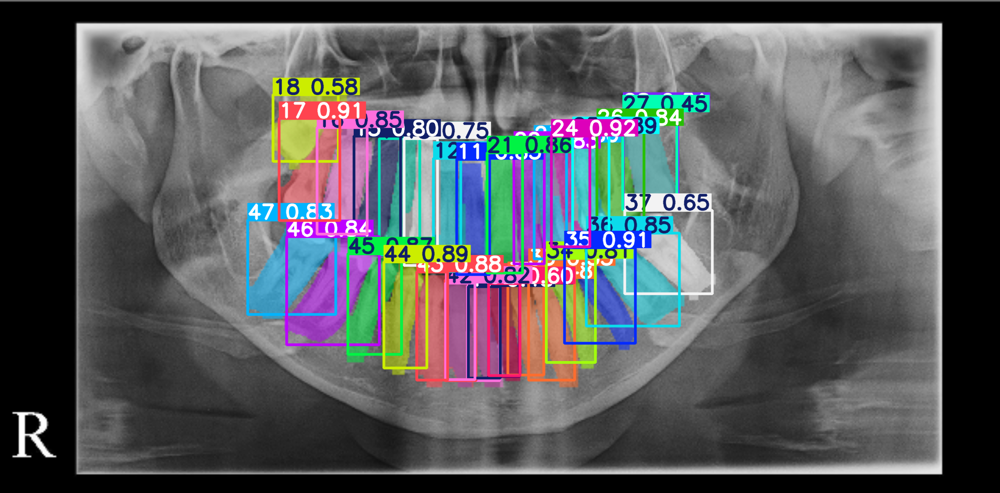

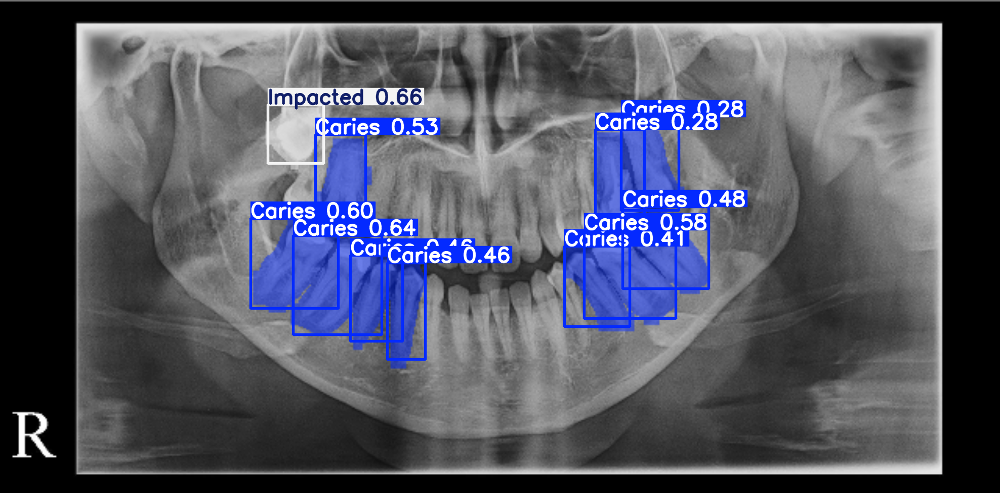

In [ ]:
import matplotlib.pyplot as plt

for r in tooth_number_results:
    frame = r.plot()
    cv2_imshow(frame)
for r in tooth_pathology_results:
    frame = r.plot()
    cv2_imshow(frame)

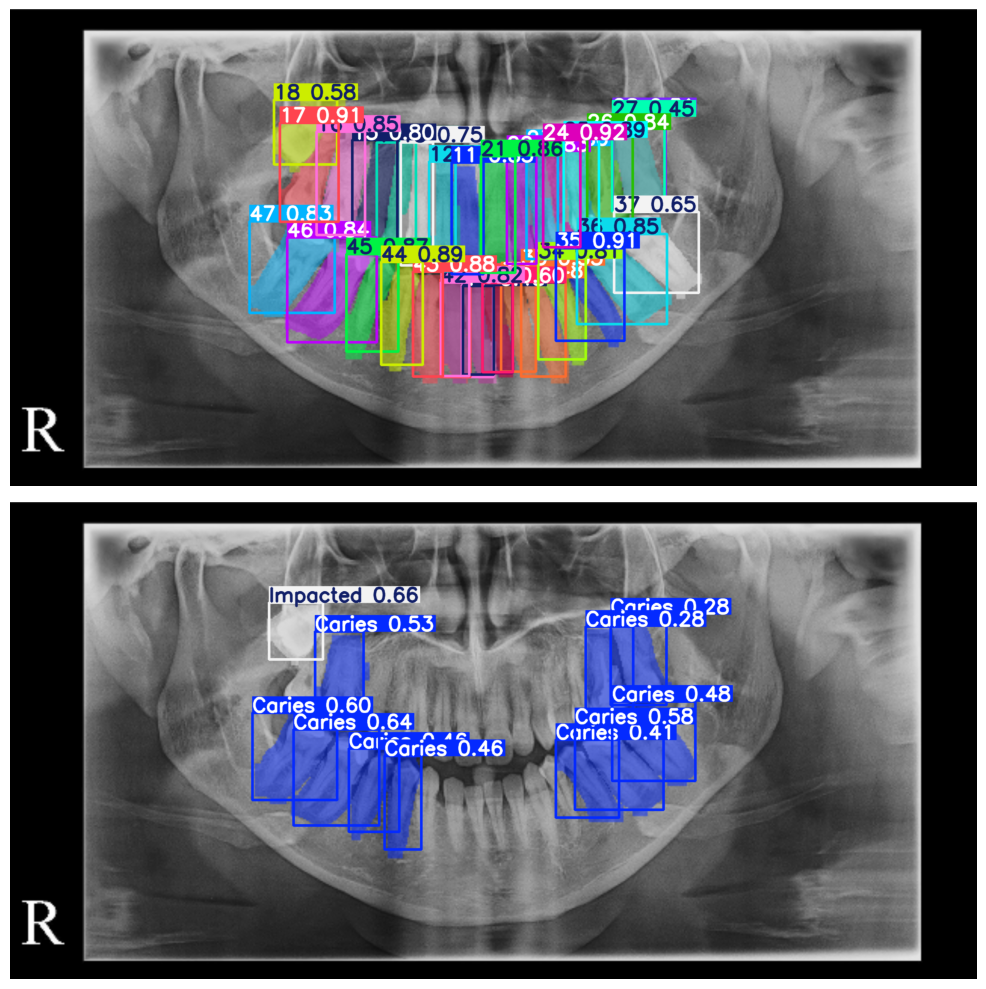

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(len(tooth_number_results) + len(tooth_pathology_results), 1, figsize=(20, 10))  # Alt çizimleri oluştur

for r in tooth_number_results:
    frame = r.plot()
    axs[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)) 
    axs[0].axis('off')  

for r in tooth_pathology_results:
    frame = r.plot()
    axs[1].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))  
    axs[1].axis('off')  

plt.tight_layout()  
plt.show() 

In [ ]:
tooth_number_results[0].boxes[0]

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([11.])
conf: tensor([0.9151])
data: tensor([[1.0899e+03, 2.6919e+02, 1.1654e+03, 4.8843e+02, 9.1509e-01, 1.1000e+01]])
id: None
is_track: False
orig_shape: (976, 1976)
shape: torch.Size([1, 6])
xywh: tensor([[1127.6387,  378.8074,   75.5394,  219.2393]])
xywhn: tensor([[0.5707, 0.3881, 0.0382, 0.2246]])
xyxy: tensor([[1089.8690,  269.1877, 1165.4084,  488.4271]])
xyxyn: tensor([[0.5516, 0.2758, 0.5898, 0.5004]])

In [ ]:
tooth_pathology_results[0].boxes[0]

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.])
conf: tensor([0.6598])
data: tensor([[529.7824, 207.9278, 639.5140, 323.6141,   0.6598,   2.0000]])
id: None
is_track: False
orig_shape: (976, 1976)
shape: torch.Size([1, 6])
xywh: tensor([[584.6482, 265.7710, 109.7316, 115.6863]])
xywhn: tensor([[0.2959, 0.2723, 0.0555, 0.1185]])
xyxy: tensor([[529.7824, 207.9278, 639.5140, 323.6141]])
xyxyn: tensor([[0.2681, 0.2130, 0.3236, 0.3316]])

In [ ]:
def iou_boxes(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_area = max(0, x2 - x1 + 1) * max(0, y2 - y1 + 1)
    union_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1) + (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1) - inter_area
    iou = inter_area / union_area
    return iou

In [ ]:
import numpy as np

number_cls = tooth_number_results[0].boxes.cls  #33
disase_cls = tooth_pathology_results[0].boxes.cls  #11
number_boxes = tooth_number_results[0].boxes.xyxy  #33
disase_boxes = tooth_pathology_results[0].boxes.xyxy  #11

In [ ]:
iou_scores = np.zeros((len(disase_cls), len(number_cls)))

for i in range(len(disase_cls)):
    for j in range(len(number_cls)):
        iou = iou_boxes(disase_boxes[i], number_boxes[j])
        iou_scores[i, j] = iou

In [ ]:
iou_scores.shape

(11, 33)

In [ ]:
max_indices_each_row = np.argmax(iou_scores, axis=1) # max satır değer index
max_indices_each_row_scores = np.max(iou_scores, axis=1) # max skor
#max_indices_each_column = np.argmax(iou_scores, axis=0) # max sütun değer index
#max_indices_each_column_scores = np.max(iou_scores, axis=0) # max skor

In [ ]:
len(disase_cls)

11

In [ ]:
tooth_pathology_model.names

{0: 'Caries', 1: 'Deep Caries', 2: 'Impacted', 3: 'Periapical Lesion'}

In [ ]:
results = []
for i in range(len(disase_cls)):
    result = {}
    result['disase_cls'] = tooth_pathology_model.names[int(disase_cls[i])]
    result['number_cls'] = tooth_number_model.names[int(number_cls[max_indices_each_row[i]])]
    result['iou_score'] = f'{max_indices_each_row_scores[i]:.3f}'
    result['number_boxes'] = number_boxes[max_indices_each_row[i]].tolist()
    result['disase_boxes'] = disase_boxes[i].tolist()
    results.append(result)

results

[{'disase_cls': 'Impacted',
  'number_cls': '18',
  'iou_score': '0.603',
  'number_boxes': [539.229248046875,
   187.4162139892578,
   668.8714599609375,
   319.4598388671875],
  'disase_boxes': [529.7824096679688,
   207.92784118652344,
   639.5139770507812,
   323.6141052246094]},
 {'disase_cls': 'Caries',
  'number_cls': '46',
  'iou_score': '0.814',
  'number_boxes': [566.5062255859375,
   468.2568664550781,
   749.6612548828125,
   682.9840087890625],
  'disase_boxes': [579.8041381835938,
   466.57427978515625,
   754.7500610351562,
   662.7610473632812]},
 {'disase_cls': 'Caries',
  'number_cls': '47',
  'iou_score': '0.870',
  'number_boxes': [489.14892578125,
   435.3179016113281,
   663.6907958984375,
   622.0010375976562],
  'disase_boxes': [495.5130310058594,
   432.98773193359375,
   668.7652587890625,
   610.5220947265625]},
 {'disase_cls': 'Caries',
  'number_cls': '36',
  'iou_score': '0.847',
  'number_boxes': [1158.52490234375,
   461.36383056640625,
   1342.263671875

In [ ]:
import numpy as np

def result_iou_calculate_boxes(disease_result, number_result):
    number_cls = number_result[0].boxes.cls
    number_boxes = number_result[0].boxes.xyxy
    disase_cls = disease_result[0].boxes.cls
    disase_boxes = disease_result[0].boxes.xyxy

    iou_scores = np.zeros((len(disase_cls), len(number_cls)))

    for i in range(len(disase_cls)):
        for j in range(len(number_cls)):
            iou = iou_boxes(disase_boxes[i], number_boxes[j])
            iou_scores[i, j] = iou

    max_indices_each_row = np.argmax(iou_scores, axis=1) # max satır değer index
    max_indices_each_row_scores = np.max(iou_scores, axis=1) # max skor
    #max_indices_each_column = np.argmax(iou_scores, axis=0) # max sütun değer index
    #max_indices_each_column_scores = np.max(iou_scores, axis=0) # max skor

    results = []
    for i in range(len(disase_cls)):
        result = {}
        result['disase_cls'] = tooth_pathology_model.names[int(disase_cls[i])]
        result['number_cls'] = tooth_number_model.names[int(number_cls[max_indices_each_row[i]])]
        result['iou_score'] = f'{max_indices_each_row_scores[i]:.3f}'
        result['number_boxes'] = number_boxes[max_indices_each_row[i]].tolist()
        result['disase_boxes'] = disase_boxes[i].tolist()
        results.append(result)

    return results

In [ ]:
tooth_results = result_iou_calculate_boxes(tooth_pathology_results, tooth_number_results)

In [ ]:
tooth_results[0]

{'disase_cls': 'Impacted',
 'number_cls': '18',
 'iou_score': '0.603',
 'number_boxes': [539.229248046875,
  187.4162139892578,
  668.8714599609375,
  319.4598388671875],
 'disase_boxes': [529.7824096679688,
  207.92784118652344,
  639.5139770507812,
  323.6141052246094]}

In [ ]:
def visualize_tooth_results_cv2(image, tooth_results):
    image_copy = image.copy()

    for result in tooth_results:
        number_box = result['number_boxes']
        disease_box = result['disase_boxes']

        cv2.rectangle(
            image_copy,
            (int(number_box[0]), int(number_box[1])),
            (int(number_box[2]), int(number_box[3])),
            (0, 255, 0),  # Yeşil renk (BGR formatında)
            2
        )
        cv2.rectangle(
            image_copy,
            (int(disease_box[0]), int(disease_box[1])),
            (int(disease_box[2]), int(disease_box[3])),
            (0, 0, 255),  # Kırmızı renk (BGR formatında)
            2
        )

        cv2.putText(
            image_copy,
            result['number_cls'],
            (int(number_box[0]), int(number_box[1]) - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (0, 255, 0),  # Yeşil renk (BGR formatında)
            2
        )
        cv2.putText(
            image_copy,
            result['disase_cls'],
            (int(disease_box[0]), int(disease_box[1]) - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (0, 0, 255),  # Kırmızı renk (BGR formatında)
            2
        )
    cv2_imshow(image_copy)

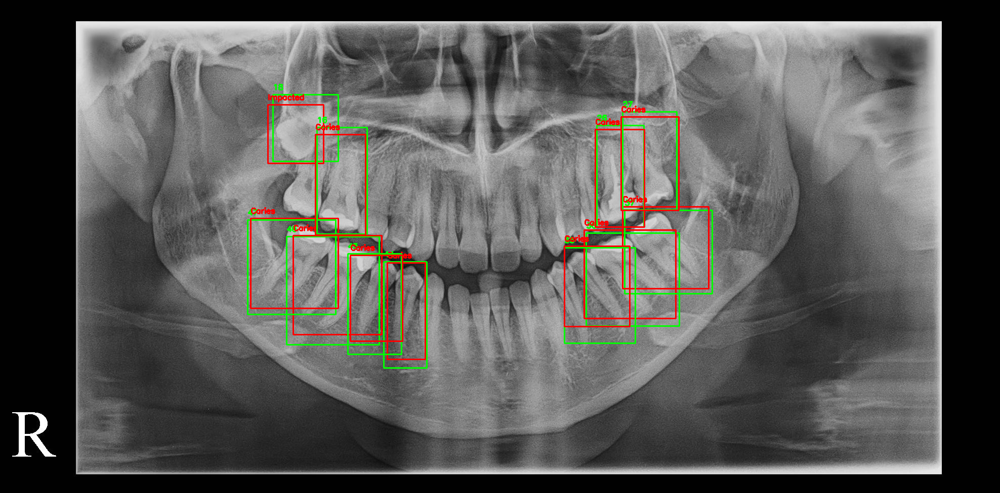

In [ ]:
visualize_tooth_results_cv2(image, tooth_results)

In [ ]:
def visualize_disease_with_number(image, tooth_results):

    image_copy = image.copy()
    color_palette = {
        'Caries' : (255, 255, 0),
        'Deep Caries' : (0, 255, 0),
        'Impacted' : (0, 0, 255),
        'Periapical Lesion' : (255, 0, 0),
    }

    for result in tooth_results:
        # Bounding box'ları çiz
        disease_box = result['disase_boxes']

        cv2.rectangle(
            image_copy,
            (int(disease_box[0]), int(disease_box[1])),
            (int(disease_box[2]), int(disease_box[3])),
            color_palette[result['disase_cls']],
            2
        )
        text = f"{result['disase_cls']} N:{result['number_cls']}"
        cv2.putText(
            image_copy,
            text,
            (int(disease_box[0]), int(disease_box[1]) - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            color_palette[result['disase_cls']],
            2
        )
    cv2_imshow(image_copy)

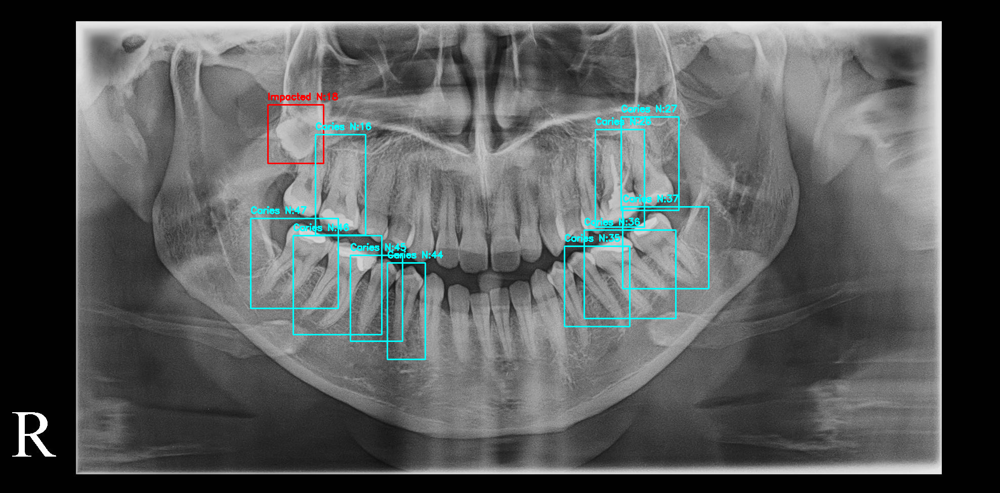

In [ ]:
visualize_disease_with_number(image, tooth_results)

In [ ]:
import numpy as np
import torch

def iou_mask(mask1, mask2):

    intersection = torch.sum(mask1 * mask2)
    union = torch.sum(mask1) + torch.sum(mask2) - intersection
    iou = intersection / (union + 1e-7)  # Sıfıra bölünmeyi önlemek için küçük bir değer eklenir
    return iou.item()

def result_iou_calculate_mask(disease_result, number_result):
    number_cls = number_result[0].boxes.cls
    number_mask = number_result[0].masks.data.squeeze(0)
    disease_cls = disease_result[0].boxes.cls
    disease_mask = disease_result[0].masks.data.squeeze(0)

    iou_scores = np.zeros((len(disase_cls), len(number_cls)))

    for i in range(len(disase_cls)):
        for j in range(len(number_cls)):
            iou = iou_mask(disease_mask[i], number_mask[j])
            iou_scores[i, j] = iou

    max_indices_each_row = np.argmax(iou_scores, axis=1) # max satır değer index
    max_indices_each_row_scores = np.max(iou_scores, axis=1) # max skor
    #max_indices_each_column = np.argmax(iou_scores, axis=0) # max sütun değer index
    #max_indices_each_column_scores = np.max(iou_scores, axis=0) # max skor

    results = []
    for i in range(len(disase_cls)):
        result = {}
        result['disase_cls'] = tooth_pathology_model.names[int(disase_cls[i])]
        result['number_cls'] = tooth_number_model.names[int(number_cls[max_indices_each_row[i]])]
        result['iou_score'] = f'{max_indices_each_row_scores[i]:.3f}'
        result['number_masks'] = number_result[0].masks[max_indices_each_row[i]].xy[0]
        result['disase_masks'] = disease_result[0].masks[i].xy[0]
        results.append(result)

    return results

In [ ]:
tooth_result_mask = result_iou_calculate_mask(tooth_pathology_results, tooth_number_results)

In [ ]:
def visualize_tooth_results_mask_cv2(image, tooth_results, alpha=0.5):

    image_copy = image.copy()
    overlay = np.zeros_like(image_copy)

    for result in tooth_results:
        number_mask = result['number_masks']
        disease_mask = result['disase_masks']

        number_mask_polygon = np.array(number_mask).reshape((-1, 1, 2)).astype(np.int32)
        disease_mask_polygon = np.array(disease_mask).reshape((-1, 1, 2)).astype(np.int32)

        number_mask_image = np.zeros_like(image)
        cv2.fillPoly(number_mask_image, [number_mask_polygon], (255, 255, 0))

        disease_mask_image = np.zeros_like(image)
        cv2.fillPoly(disease_mask_image, [disease_mask_polygon],(0,0,255))

        combined_mask = cv2.bitwise_or(number_mask_image, disease_mask_image)

        overlay = cv2.add(overlay, combined_mask)

    cv2.addWeighted(overlay, alpha, image_copy, 1 - alpha, 0, image_copy)

    cv2_imshow(image_copy)

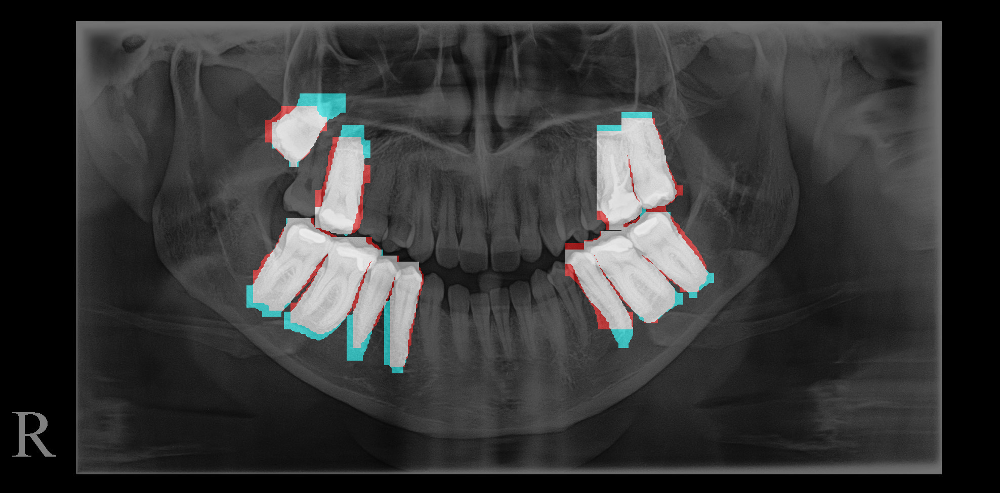

In [ ]:
visualize_tooth_results_mask_cv2(image, tooth_result_mask)

In [ ]:
tooth_result_mask[0]

{'disase_cls': 'Impacted',
 'number_cls': '18',
 'iou_score': '0.631',
 'number_masks': array([[      592.8,      185.43],
        [      592.8,      194.69],
        [     589.71,      197.77],
        [     589.71,      203.95],
        [     586.62,      207.04],
        [     586.62,      210.12],
        [     571.19,      225.56],
        [     565.01,      225.56],
        [     552.66,      237.91],
        [     549.58,      237.91],
        [     546.49,         241],
        [     537.23,         241],
        [     537.23,      293.49],
        [     546.49,      293.49],
        [     561.92,      308.92],
        [     561.92,      312.01],
        [     565.01,       315.1],
        [      568.1,       315.1],
        [     571.19,      318.19],
        [     571.19,      330.54],
        [     589.71,      330.54],
        [     589.71,      321.27],
        [     611.33,      299.66],
        [     611.33,      296.58],
        [     620.59,      287.31],
        [    

In [ ]:
import numpy as np
from shapely.geometry import Polygon
from shapely.ops import cascaded_union

def create_intersection_mask(tooth_result_mask):
    all_number_polygons = []
    all_disease_polygons = []

    for result in tooth_result_mask:
        number_mask_polygon = Polygon(result['number_masks'])
        disease_mask_polygon = Polygon(result['disase_masks'])
        all_number_polygons.append(number_mask_polygon)
        all_disease_polygons.append(disease_mask_polygon)

    intersection_polygons = []
    for number_polygon, disease_polygon in zip(all_number_polygons, all_disease_polygons):
        info = {}
        intersection_polygon = number_polygon.intersection(disease_polygon)
        if intersection_polygon.is_empty:  # Kesişim yoksa atla
            continue
        intersection_polygons.append(intersection_polygon)

    intersection_polygon_union = cascaded_union(intersection_polygons)

    mask_image = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
    if intersection_polygon_union.geom_type == 'Polygon':
        exterior_coords = np.array(intersection_polygon_union.exterior.coords).astype(int)
        cv2.fillPoly(mask_image, [exterior_coords], 255)
    elif intersection_polygon_union.geom_type == 'MultiPolygon':
        for polygon in intersection_polygon_union.geoms:
            exterior_coords = np.array(polygon.exterior.coords).astype(int)
            cv2.fillPoly(mask_image, [exterior_coords], 255)

    return mask_image, intersection_polygons

<ipython-input-145-1580ea40f87e>:26: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  intersection_polygon_union = cascaded_union(intersection_polygons)


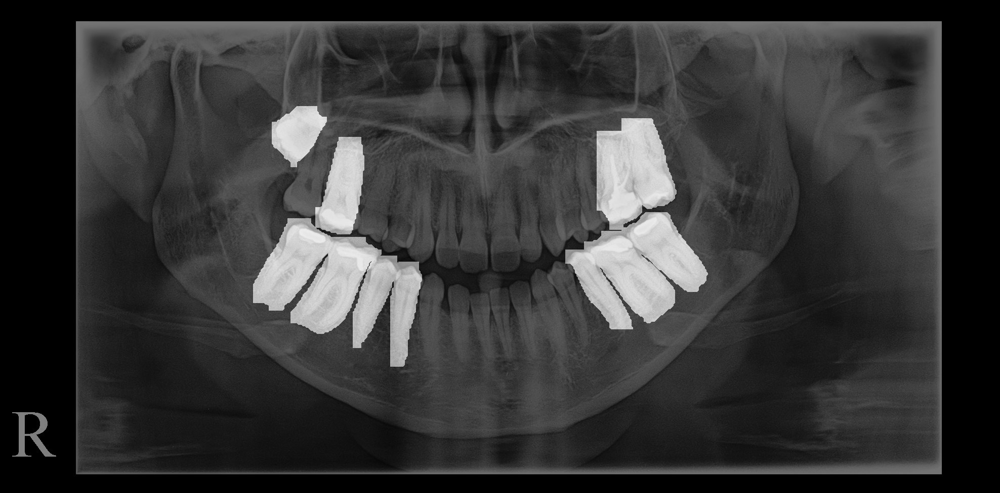

In [ ]:
intersection_mask, intersection_polygons = create_intersection_mask(tooth_result_mask)

image_copy = image.copy()

intersection_mask_rgb = cv2.cvtColor(intersection_mask, cv2.COLOR_GRAY2BGR)

cv2.addWeighted(intersection_mask_rgb, 0.5, image_copy, 0.5, 0, image_copy)

cv2_imshow(image_copy)

In [ ]:
import numpy as np
from shapely.geometry import Polygon
from shapely.ops import cascaded_union

def create_boxes_from_intersection(tooth_result_mask):
    all_number_polygons = []
    all_disease_polygons = []
    for result in tooth_result_mask:
        number_mask_polygon = Polygon(result['number_masks'])
        disease_mask_polygon = Polygon(result['disase_masks'])
        all_number_polygons.append(number_mask_polygon)
        all_disease_polygons.append(disease_mask_polygon)

    newBoxes = []
    for number_polygon, disease_polygon in zip(all_number_polygons, all_disease_polygons):
        intersection_polygon = number_polygon.intersection(disease_polygon)
        if intersection_polygon.is_empty:  # Kesişim yoksa atla
            newBoxes.append(number_polygon.bounds)
            continue
        newBoxes.append(intersection_polygon.bounds)
    return newBoxes

In [ ]:
def create_result_intersection(tooth_result_mask):
    newBoxes = create_boxes_from_intersection(tooth_result_mask)
    newResult = tooth_result_mask

    for idx, results in enumerate(newResult):
        results['intersection_boxes'] = newBoxes[idx]

    return newResult

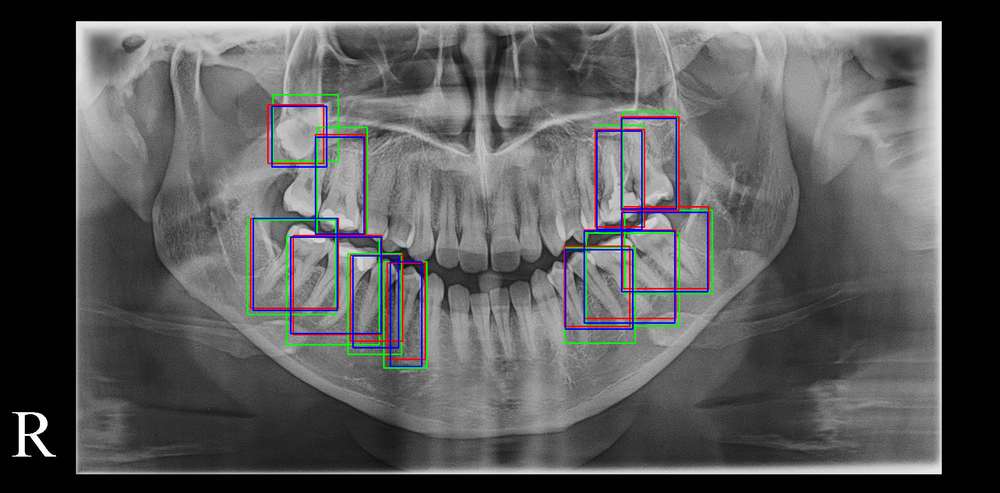

In [ ]:
newResult = create_result_intersection(tooth_result_mask)

image_copy = image.copy()

for result in tooth_results:
    number_box = result['number_boxes']
    disease_box = result['disase_boxes']

    cv2.rectangle(
        image_copy,
        (int(number_box[0]), int(number_box[1])),
        (int(number_box[2]), int(number_box[3])),
        (0, 255, 0),  # Yeşil renk (BGR formatında)
        2
    )
    cv2.rectangle(
        image_copy,
        (int(disease_box[0]), int(disease_box[1])),
        (int(disease_box[2]), int(disease_box[3])),
        (0, 0, 255),  # Kırmızı renk (BGR formatında)
        2
    )
for result in newResult:
    boxes = result['intersection_boxes']

    cv2.rectangle(
        image_copy,
        (int(boxes[0]), int(boxes[1])),
        (int(boxes[2]), int(boxes[3])),
        (255, 0, 0),  # Mavi renk (BGR formatında)
        2
    )

cv2_imshow(image_copy)

In [ ]:
!pip install -qU gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 MB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.4/320.4 kB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 95.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.4 MB/s eta 0:00:00


In [ ]:
tooth_results[0]

{'disase_cls': 'Impacted',
 'number_cls': '18',
 'iou_score': '0.603',
 'number_boxes': [539.229248046875,
  187.4162139892578,
  668.8714599609375,
  319.4598388671875],
 'disase_boxes': [529.7824096679688,
  207.92784118652344,
  639.5139770507812,
  323.6141052246094]}

In [ ]:
import gradio as gr

def predict_and_visualize(pil_image):
  numpy_image = np.array(pil_image)
  image = cv2.cvtColor(numpy_image, cv2.COLOR_RGB2BGR)


  tooth_number_results = tooth_number_model.predict(image)
  tooth_pathology_results = tooth_pathology_model.predict(image)

  tooth_results = result_iou_calculate_boxes(tooth_pathology_results, tooth_number_results)

  annotations = []
  for result in tooth_results:
        annotations.append(
            (
                (int(result['disase_boxes'][0]), int(result['disase_boxes'][1]), int(result['disase_boxes'][2]), int(result['disase_boxes'][3])),
                result['disase_cls'],
            ),
        )
  annotated_image = (pil_image, annotations)

  return annotated_image

iface = gr.Interface(
    fn=predict_and_visualize,
    inputs=gr.Image(type="pil"),
    outputs=gr.AnnotatedImage(),
    title="Diş Numarası ve Patolojisi Tespiti",
    description="Bir diş röntgeni yükleyin ve diş numaralarını ve patolojilerini tespit edin.",
)

iface.launch()

Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7861 <> https://7bf7e92102e8b5a0fe.gradio.live


In [ ]:
import plotly.express as px
import plotly.graph_objects as go

def visualize_bboxes_interactive(image, bboxes, labels):
    fig = px.imshow(image)
    for bbox, label in zip(bboxes, labels):
        fig.add_shape(
            type="rect",
            x0=bbox[0],
            y0=bbox[1],
            x1=bbox[2],
            y1=bbox[3],
            line=dict(color="red", width=2),
        )
        fig.add_annotation(
            x=bbox[0],
            y=bbox[1] - 10,
            text=label,
            showarrow=False,
            font=dict(color="red"),
            bgcolor="white",
        )
    fig.show()

bboxes = [(50, 50, 200, 200), (300, 100, 450, 300)]
labels = ["Kedi", "Köpek"]
visualize_bboxes_interactive(image, bboxes, labels)


In [ ]:
!pip install -qU dash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 12.3 MB/s eta 0:00:00


In [ ]:
image = cv2.imread('/content/train_49_png.rf.56c1159720608fdc7726fe61b4ceeba6.jpg')

In [ ]:
import plotly.graph_objects as go
import numpy as np

def visualize_bboxes_plotly(image, bboxes, labels, colors, alpha=0.5):
    fig = go.Figure()
    fig.add_trace(go.Image(z=image, hoverinfo='skip'))

    for bbox, label, color in zip(bboxes, labels, colors):
        x1, y1, x2, y2 = bbox

        color_str = f"rgb({color[0]}, {color[1]}, {color[2]})"
        fig.add_trace(
            go.Scatter(
                x=[x1, x2, x2, x1, x1],  # Dikdörtgenin köşe noktaları
                y=[y1, y1, y2, y2, y1],
                mode="lines",  # Sadece çizgileri göster
                line=dict(color=color_str, width=2),
                fill="toself",  # Dikdörtgeni doldur
                fillcolor=f"rgba({color[0]}, {color[1]}, {color[2]}, {alpha})",
                # Hover özellikleri
                hoverinfo="text",
                hovertext=label,
                showlegend=False,  # Legend'da gösterme
                hoveron='points+fills'
            )
        )
        '''
        # Etiket ekle
        fig.add_annotation(
            x=x1, y=y1 - 10,  # Etiketin başlangıç noktası
            text=label,
            showarrow=False,
            font=dict(color="black", size=12),
            bgcolor=f"rgba({color[0]}, {color[1]}, {color[2]}, 0.8)"
        )
        '''
    fig.update_xaxes(visible=False, range=[0, image.shape[1]],showspikes=False)
    fig.update_yaxes(visible=False, range=[0, image.shape[0]],showspikes=False)
    fig.update_layout(
        margin=dict(l=0, r=0, t=0, b=0),
        height=image.shape[0],
        width=image.shape[1],
        hovermode='closest'
    )

    return fig

bboxes = [(50, 50, 200, 200), (300, 100, 450, 300)]  # Bounding box koordinatları
labels = ["Kedi", "Köpek"]  # Etiketler
colors = [(255, 0, 0), (0, 255, 0)]  # Kutular için renkler (RGB formatında)

fig = visualize_bboxes_plotly(image, bboxes, labels, colors, alpha=0.4)
fig.show()